In [1]:
pkgs <- c("tidyverse","readxl","readr","janitor","lubridate")
pkgs_to_install <- setdiff(pkgs, rownames(installed.packages()))
if(length(pkgs_to_install)) install.packages(pkgs_to_install, repos = "https://cloud.r-project.org")
library(tidyverse); library(readxl); library(readr); library(janitor); library(lubridate)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘snakecase’


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.2
✔ ggplot2   4.0.0     ✔ tibble    3.3.0
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.1.0     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘janitor’


The following objects are masked from ‘package:stats’:

    chisq.test, fisher.test




In [2]:
list.files()


[1] "online_retail_II.csv" "sample_data"

In [3]:
df_raw <- read_csv("online_retail_II.csv", guess_max = 100000)
dim(df_raw)
colnames(df_raw)
head(df_raw, 5)


Rows: 1067371 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (4): Invoice, StockCode, Description, Country
dbl  (3): Quantity, Price, Customer ID
dttm (1): InvoiceDate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


[1] 1067371       8

[1] "Invoice"     "StockCode"   "Description" "Quantity"    "InvoiceDate"
[6] "Price"       "Customer ID" "Country"

Invoice,StockCode,Description,Quantity,InvoiceDate,Price,Customer ID,Country
<chr>,<chr>,<chr>,<dbl>,<dttm>,<dbl>,<dbl>,<chr>
489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085,United Kingdom
489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom
489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom
489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085,United Kingdom
489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085,United Kingdom


In [4]:
library(janitor)
df_raw <- janitor::clean_names(df_raw)
colnames(df_raw)


[1] "invoice"      "stock_code"   "description"  "quantity"     "invoice_date"
[6] "price"        "customer_id"  "country"

In [5]:
df <- df_raw %>%
  mutate(
    revenue = quantity * price
  ) %>%
  filter(quantity > 0, price > 0) %>%
  filter(!is.na(customer_id))

dim(df)
summary(df$revenue)
head(df, 5)


[1] 805549      9

     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
1.000e-03 4.950e+00 1.185e+01 2.203e+01 1.950e+01 1.685e+05 

invoice,stock_code,description,quantity,invoice_date,price,customer_id,country,revenue
<chr>,<chr>,<chr>,<dbl>,<dttm>,<dbl>,<dbl>,<chr>,<dbl>
489434,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,12,2009-12-01 07:45:00,6.95,13085,United Kingdom,83.4
489434,79323P,PINK CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom,81.0
489434,79323W,WHITE CHERRY LIGHTS,12,2009-12-01 07:45:00,6.75,13085,United Kingdom,81.0
489434,22041,"RECORD FRAME 7"" SINGLE SIZE",48,2009-12-01 07:45:00,2.10,13085,United Kingdom,100.8
489434,21232,STRAWBERRY CERAMIC TRINKET BOX,24,2009-12-01 07:45:00,1.25,13085,United Kingdom,30.0


In [6]:
dir.create("data", showWarnings = FALSE)
write_csv(df, "data/online_retail_clean.csv")


In [7]:
df <- read_csv("data/online_retail_clean.csv")


Rows: 805549 Columns: 9
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (3): stock_code, description, country
dbl  (5): invoice, quantity, price, customer_id, revenue
dttm (1): invoice_date

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


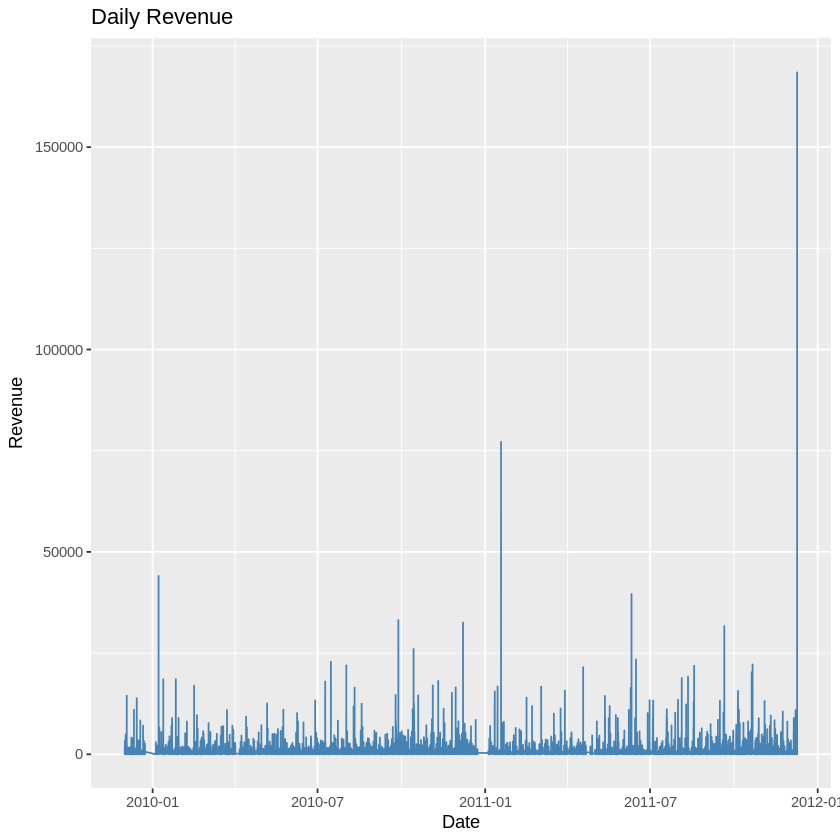

In [8]:
# revenue by day
daily_sales <- df %>%
  group_by(invoice_date) %>%
  summarise(daily_revenue = sum(revenue))

ggplot(daily_sales, aes(x = invoice_date, y = daily_revenue)) +
  geom_line(color = "steelblue") +
  labs(title = "Daily Revenue", x = "Date", y = "Revenue")


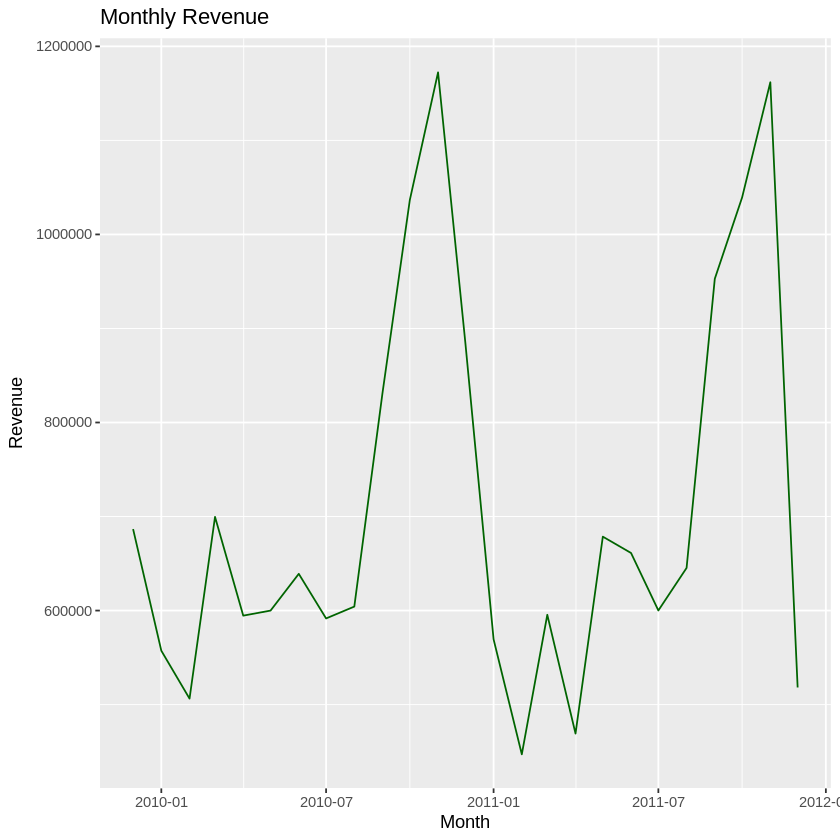

In [9]:
# year-month
df <- df %>%
  mutate(month = floor_date(invoice_date, "month"))

monthly_sales <- df %>%
  group_by(month) %>%
  summarise(monthly_revenue = sum(revenue))

ggplot(monthly_sales, aes(x = month, y = monthly_revenue)) +
  geom_line(color = "darkgreen") +
  labs(title = "Monthly Revenue", x = "Month", y = "Revenue")


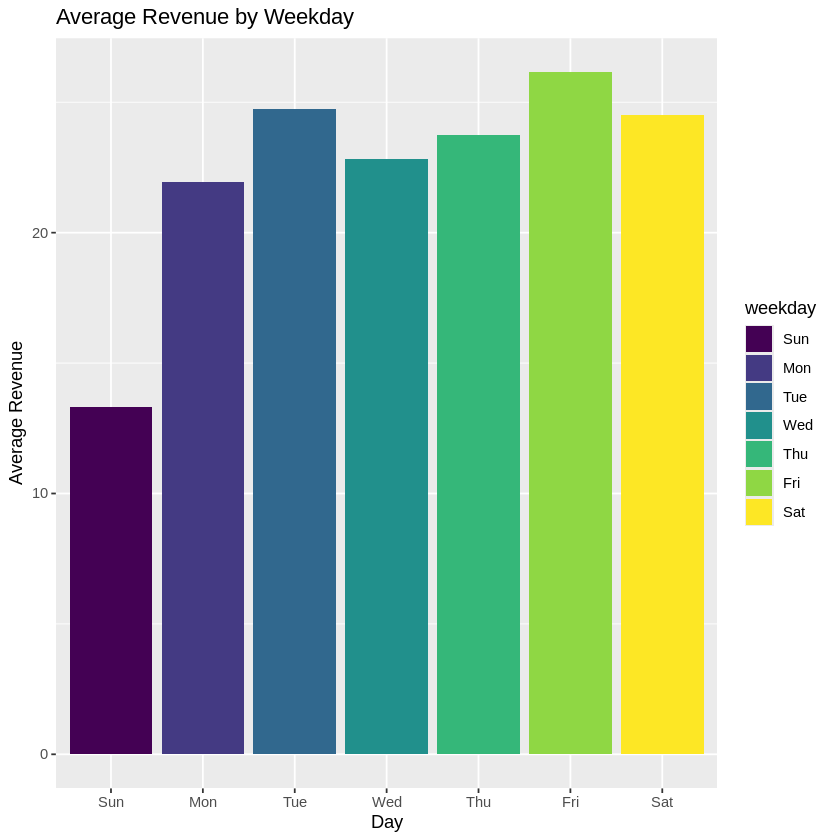

In [10]:
# weekday
df %>%
  mutate(weekday = wday(invoice_date, label = TRUE)) %>%
  group_by(weekday) %>%
  summarise(avg_revenue = mean(revenue)) %>%
  ggplot(aes(x = weekday, y = avg_revenue, fill = weekday)) +
  geom_col() +
  labs(title = "Average Revenue by Weekday", x = "Day", y = "Average Revenue")


In [11]:
customer_sales <- df %>%
  group_by(customer_id) %>%
  summarise(total_spent = sum(revenue),
            transactions = n_distinct(invoice)) %>%
  arrange(desc(total_spent))

head(customer_sales, 10)   # top 10 customers


customer_id,total_spent,transactions
<dbl>,<dbl>,<int>
18102,608821.7,145
14646,528602.5,151
14156,313946.4,156
14911,295972.6,398
17450,246973.1,51
13694,196482.8,143
17511,175603.5,60
16446,168472.5,2
16684,147142.8,55


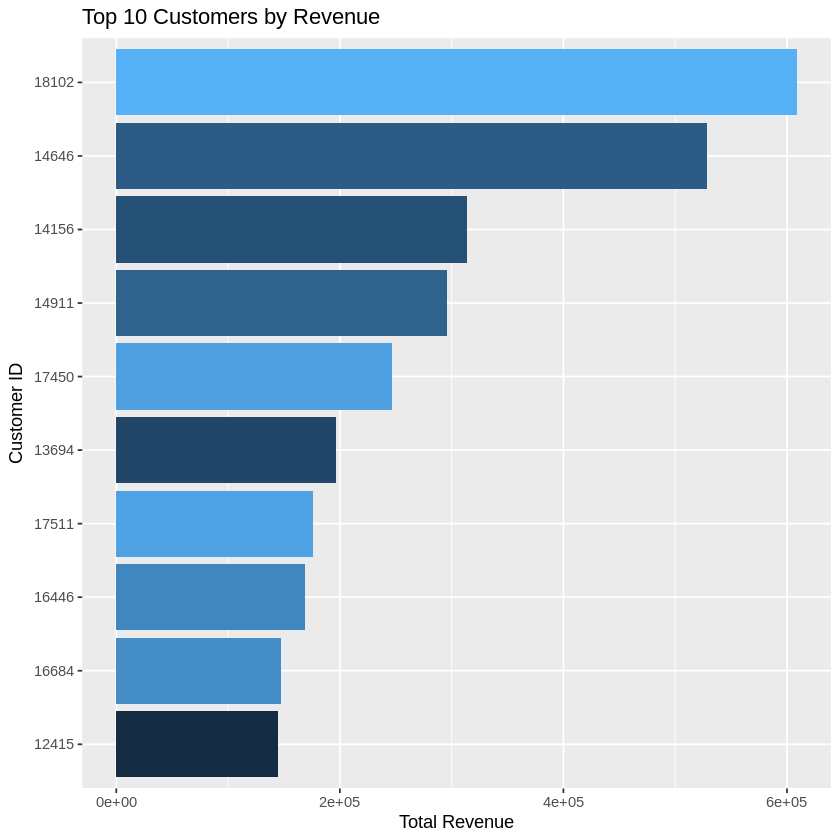

In [12]:
customer_sales %>%
  top_n(10, total_spent) %>%
  ggplot(aes(x = reorder(customer_id, total_spent), y = total_spent, fill = customer_id)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Top 10 Customers by Revenue", x = "Customer ID", y = "Total Revenue")


In [13]:
avg_spend <- customer_sales %>%
  summarise(avg_transaction_value = mean(total_spent / transactions))

avg_spend


avg_transaction_value
<dbl>
391.7265


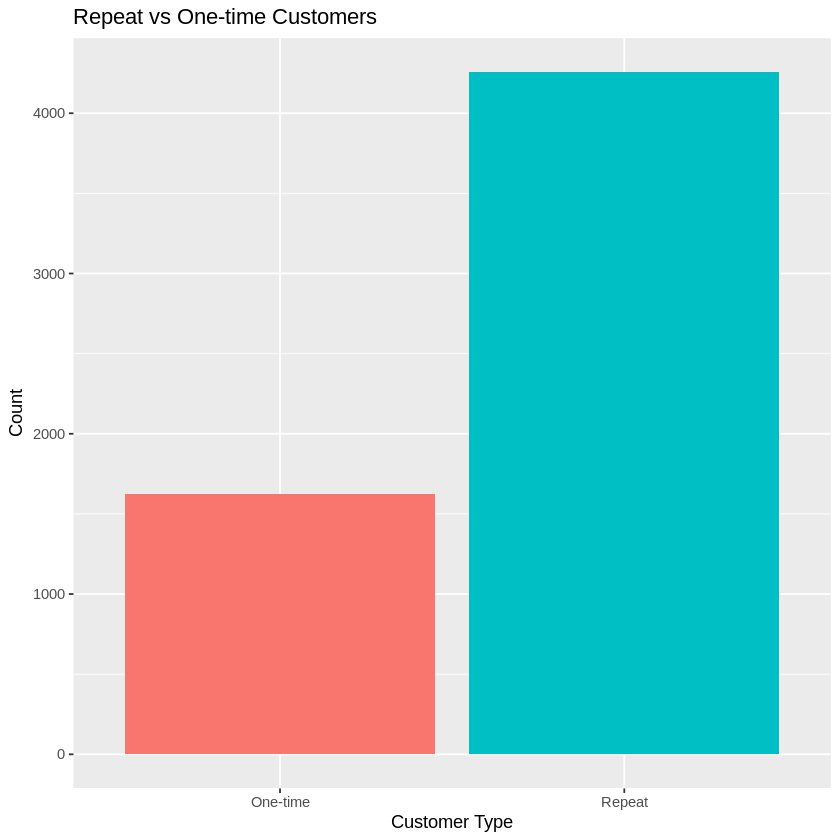

In [14]:
customer_sales %>%
  mutate(customer_type = if_else(transactions > 1, "Repeat", "One-time")) %>%
  count(customer_type) %>%
  ggplot(aes(x = customer_type, y = n, fill = customer_type)) +
  geom_col(show.legend = FALSE) +
  labs(title = "Repeat vs One-time Customers", x = "Customer Type", y = "Count")


In [15]:
product_sales <- df %>%
  group_by(stock_code, description) %>%
  summarise(total_revenue = sum(revenue),
            total_quantity = sum(quantity),
            .groups = "drop") %>%
  arrange(desc(total_revenue))

head(product_sales, 10)  # Top 10 products


stock_code,description,total_revenue,total_quantity
<chr>,<chr>,<dbl>,<dbl>
22423,REGENCY CAKESTAND 3 TIER,286486.30,24899
85123A,WHITE HANGING HEART T-LIGHT HOLDER,252072.46,93640
23843,"PAPER CRAFT , LITTLE BIRDIE",168469.60,80995
M,Manual,152340.57,9803
85099B,JUMBO BAG RED RETROSPOT,136980.08,75759
84879,ASSORTED COLOUR BIRD ORNAMENT,127074.17,79913
POST,POSTAGE,126563.04,5333
47566,PARTY BUNTING,103880.23,23607
23166,MEDIUM CERAMIC TOP STORAGE JAR,81416.73,77916


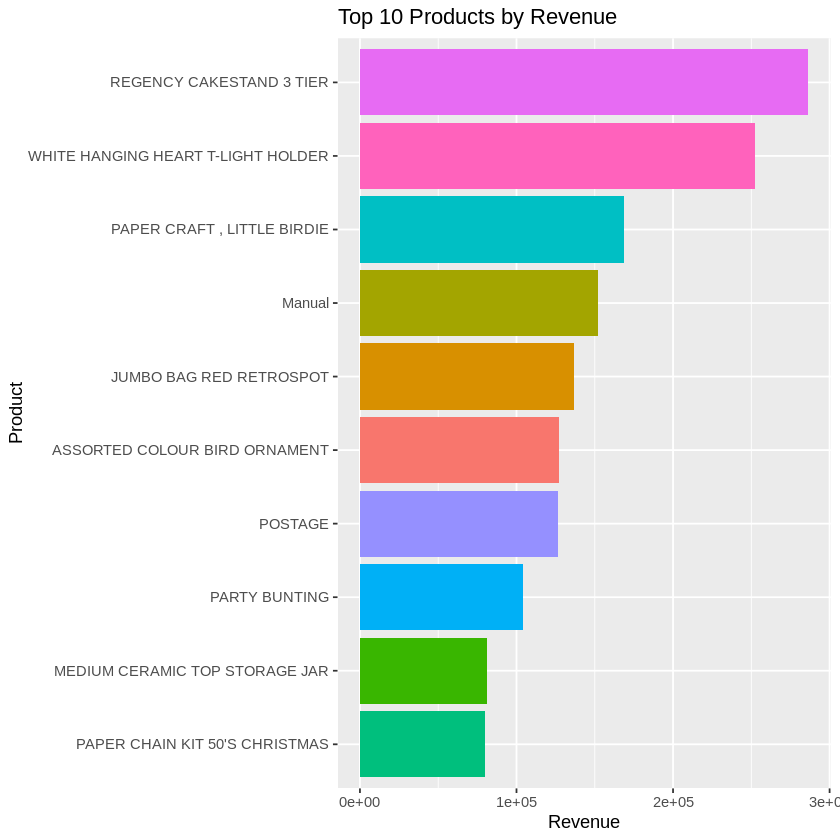

In [16]:
product_sales %>%
  top_n(10, total_revenue) %>%
  ggplot(aes(x = reorder(description, total_revenue), y = total_revenue, fill = description)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Top 10 Products by Revenue", x = "Product", y = "Revenue")


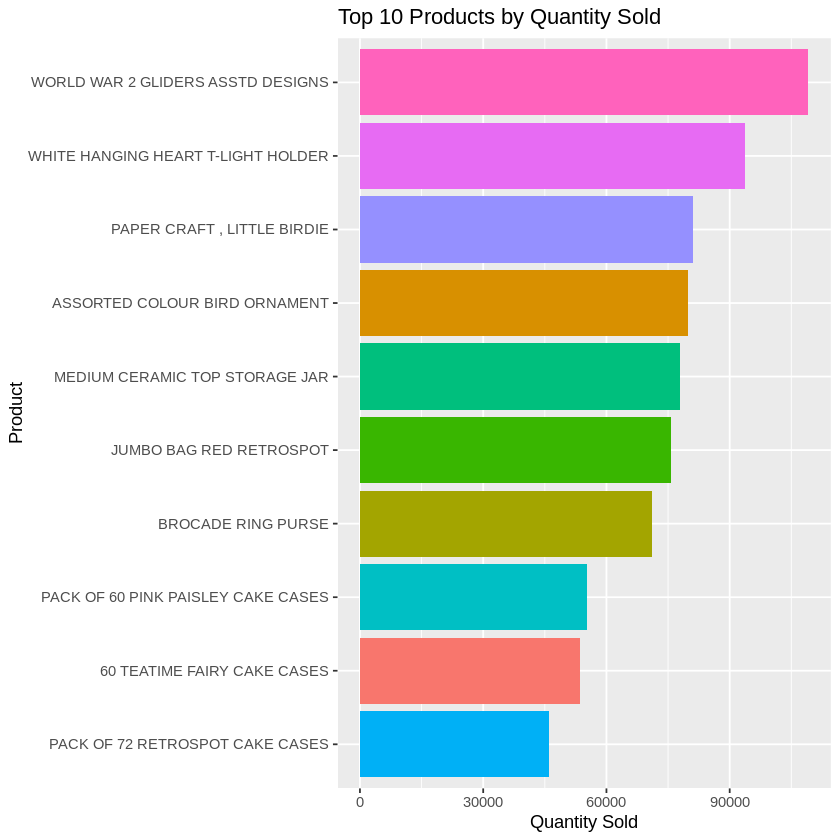

In [17]:
product_sales %>%
  top_n(10, total_quantity) %>%
  ggplot(aes(x = reorder(description, total_quantity), y = total_quantity, fill = description)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Top 10 Products by Quantity Sold", x = "Product", y = "Quantity Sold")


Warning message:
“Removed 519 rows containing non-finite outside the scale range (`stat_bin()`).”
Warning message:
“Removed 2 rows containing missing values or values outside the scale range
(`geom_bar()`).”


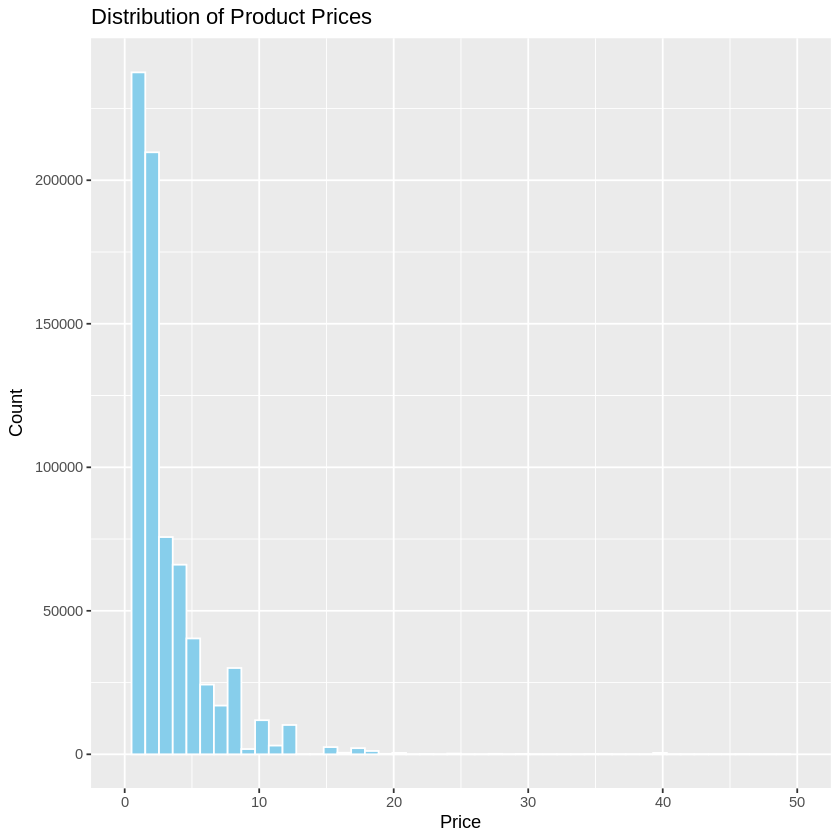

In [18]:
df %>%
  ggplot(aes(x = price)) +
  geom_histogram(bins = 50, fill = "skyblue", color = "white") +
  scale_x_continuous(limits = c(0, 50)) +  # limit to avoid extreme outliers
  labs(title = "Distribution of Product Prices", x = "Price", y = "Count")


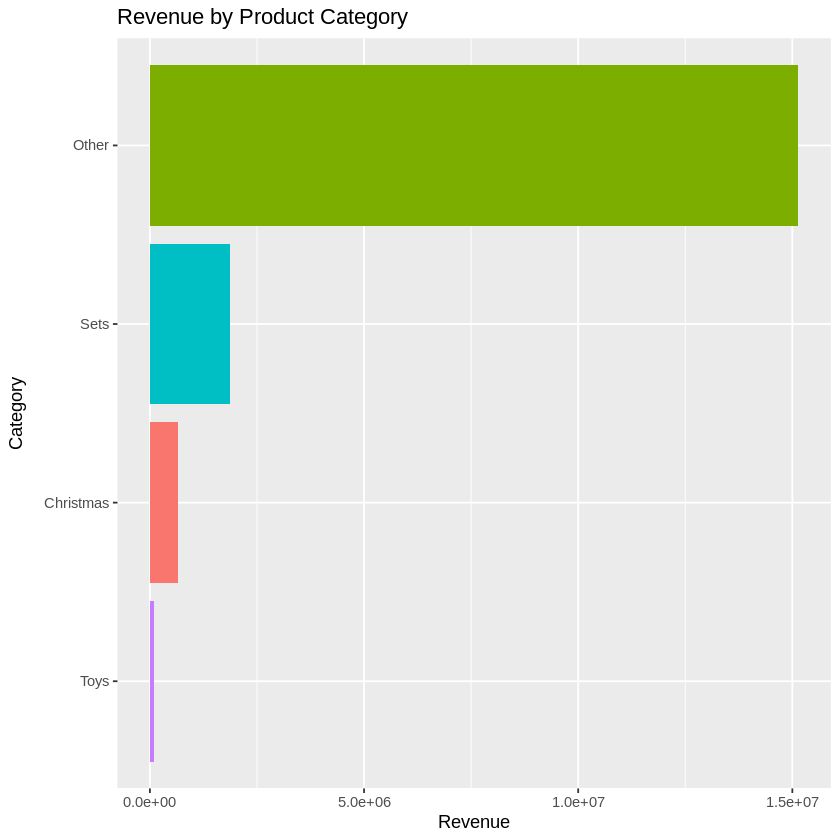

In [19]:
df %>%
  mutate(category = case_when(
    str_detect(description, "CHRISTMAS") ~ "Christmas",
    str_detect(description, "TOY") ~ "Toys",
    str_detect(description, "SET") ~ "Sets",
    TRUE ~ "Other"
  )) %>%
  group_by(category) %>%
  summarise(total_revenue = sum(revenue)) %>%
  ggplot(aes(x = reorder(category, total_revenue), y = total_revenue, fill = category)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Revenue by Product Category", x = "Category", y = "Revenue")


In [20]:
country_sales <- df %>%
  group_by(country) %>%
  summarise(total_revenue = sum(revenue),
            total_quantity = sum(quantity),
            customers = n_distinct(customer_id)) %>%
  arrange(desc(total_revenue))

head(country_sales, 10)  # Top 10 countries


country,total_revenue,total_quantity,customers
<chr>,<dbl>,<dbl>,<int>
United Kingdom,14723147.52,8705313,5350
EIRE,621631.11,321703,5
Netherlands,554232.34,383977,22
Germany,431262.46,227983,107
France,355257.47,273674,95
Australia,169968.11,104090,15
Spain,109178.53,50796,41
Switzerland,100365.34,52337,22
Sweden,91549.72,88512,19


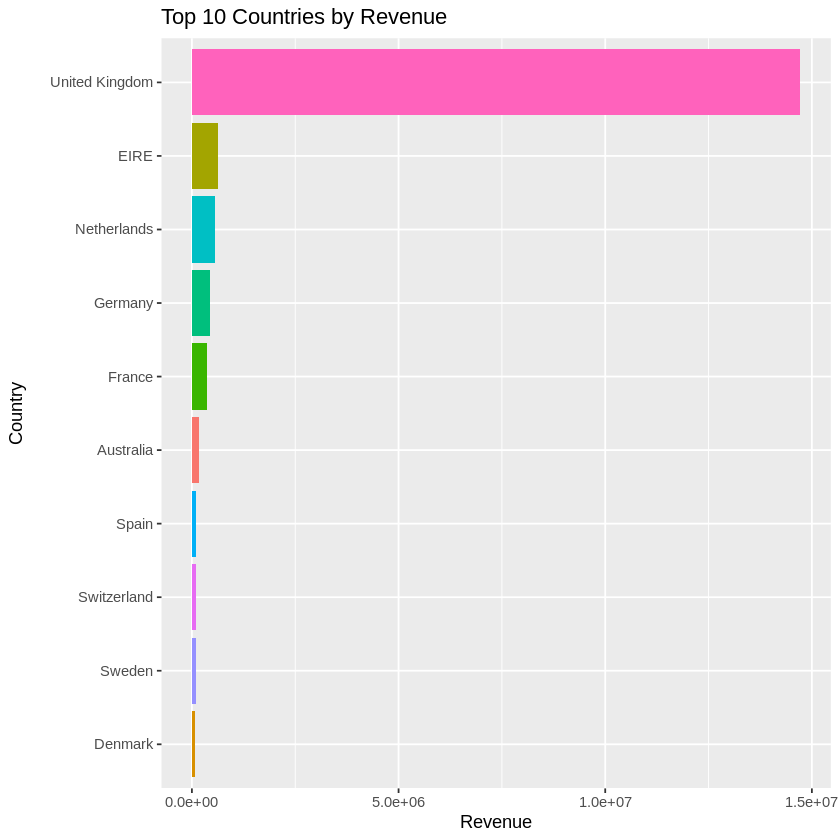

In [21]:
country_sales %>%
  top_n(10, total_revenue) %>%
  ggplot(aes(x = reorder(country, total_revenue), y = total_revenue, fill = country)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Top 10 Countries by Revenue", x = "Country", y = "Revenue")


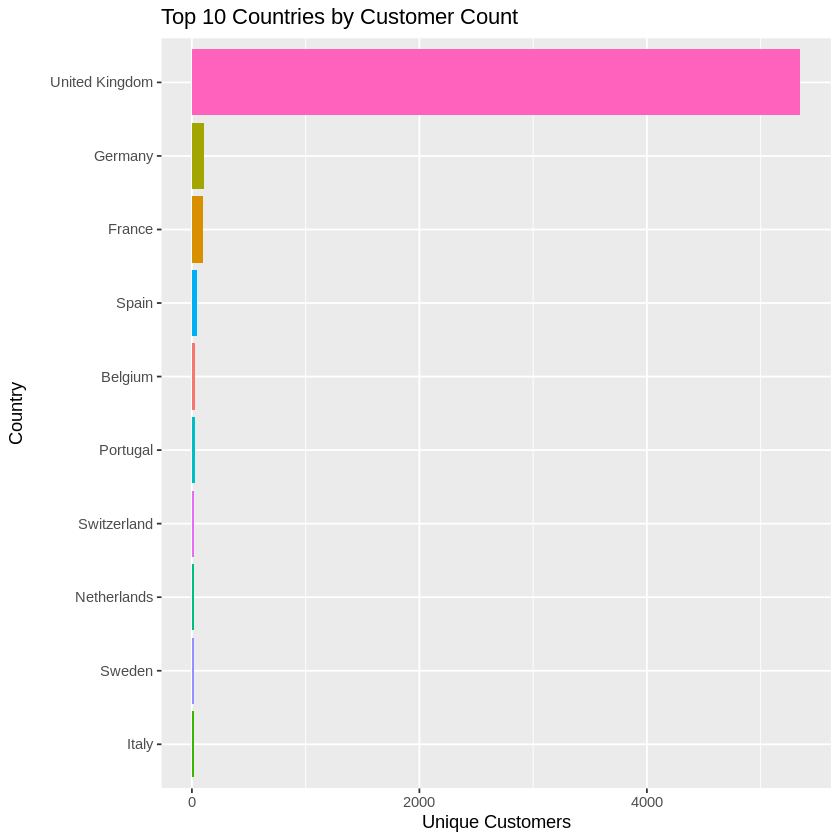

In [22]:
country_sales %>%
  top_n(10, customers) %>%
  ggplot(aes(x = reorder(country, customers), y = customers, fill = country)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Top 10 Countries by Customer Count", x = "Country", y = "Unique Customers")


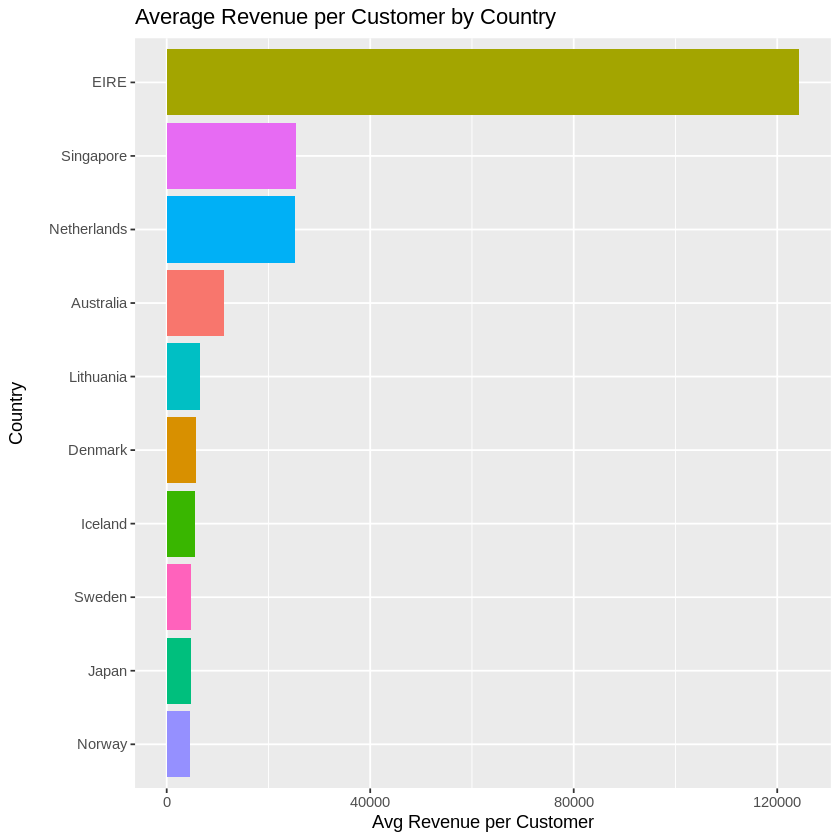

In [23]:
country_sales %>%
  mutate(avg_revenue_per_customer = total_revenue / customers) %>%
  top_n(10, avg_revenue_per_customer) %>%
  ggplot(aes(x = reorder(country, avg_revenue_per_customer), y = avg_revenue_per_customer, fill = country)) +
  geom_col(show.legend = FALSE) +
  coord_flip() +
  labs(title = "Average Revenue per Customer by Country", x = "Country", y = "Avg Revenue per Customer")


In [24]:
df <- df %>%
  mutate(revenue = quantity * price)


In [25]:
customer_features <- df %>%
  group_by(customer_id) %>%
  summarise(
    total_spent = sum(revenue),
    total_quantity = sum(quantity),
    num_transactions = n_distinct(invoice),
    avg_spent_per_transaction = total_spent / num_transactions,
    first_purchase = min(invoice_date),
    last_purchase = max(invoice_date),
    .groups = "drop"
  ) %>%
  mutate(
    recency_days = as.numeric(difftime(max(df$invoice_date), last_purchase, units = "days")),
    tenure_days = as.numeric(difftime(last_purchase, first_purchase, units = "days"))
  )


In [31]:
model_data <- customer_features %>%
  select(-customer_id, -first_purchase, -last_purchase)


In [32]:
set.seed(123)
library(caret)

trainIndex <- createDataPartition(model_data$total_spent, p = 0.8, list = FALSE)
train <- model_data[trainIndex, ]
test  <- model_data[-trainIndex, ]


In [28]:
pkgs <- c("caret")
pkgs_to_install <- setdiff(pkgs, rownames(installed.packages()))
if(length(pkgs_to_install)) install.packages(pkgs_to_install, repos = "https://cloud.r-project.org")
library(caret)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘listenv’, ‘parallelly’, ‘future’, ‘globals’, ‘shape’, ‘future.apply’, ‘numDeriv’, ‘progressr’, ‘SQUAREM’, ‘diagram’, ‘lava’, ‘prodlim’, ‘proxy’, ‘iterators’, ‘clock’, ‘gower’, ‘hardhat’, ‘ipred’, ‘sparsevctrs’, ‘timeDate’, ‘e1071’, ‘foreach’, ‘ModelMetrics’, ‘plyr’, ‘pROC’, ‘recipes’, ‘reshape2’


Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift




In [33]:
lm_model <- lm(total_spent ~ ., data = train)
summary(lm_model)



Call:
lm(formula = total_spent ~ ., data = train)

Residuals:
    Min      1Q  Median      3Q     Max 
-121221    -107     152     410  316670 

Coefficients:
                            Estimate Std. Error t value Pr(>|t|)    
(Intercept)               -446.93973  222.58304  -2.008 0.044704 *  
total_quantity               1.41100    0.01720  82.026  < 2e-16 ***
num_transactions           168.61315    9.92096  16.996  < 2e-16 ***
avg_spent_per_transaction    0.87325    0.17917   4.874 1.13e-06 ***
recency_days                 0.02851    0.51561   0.055 0.955903    
tenure_days                 -1.71434    0.44834  -3.824 0.000133 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6122 on 4698 degrees of freedom
Multiple R-squared:  0.7976,	Adjusted R-squared:  0.7974 
F-statistic:  3703 on 5 and 4698 DF,  p-value: < 2.2e-16


In [36]:
library(randomForest)
rf_model <- randomForest(total_spent ~ ., data = train, ntree = 200, mtry = 3)
rf_model



Call:
 randomForest(formula = total_spent ~ ., data = train, ntree = 200,      mtry = 3) 
               Type of random forest: regression
                     Number of trees: 200
No. of variables tried at each split: 3

          Mean of squared residuals: 47593057
                    % Var explained: 74.26

In [37]:
# Predictions
lm_preds <- predict(lm_model, newdata = test)
rf_preds <- predict(rf_model, newdata = test)

# RMSE function
rmse <- function(actual, predicted) {
  sqrt(mean((actual - predicted)^2))
}

cat("Linear Regression RMSE:", rmse(test$total_spent, lm_preds), "\n")
cat("Random Forest RMSE:", rmse(test$total_spent, rf_preds), "\n")


Linear Regression RMSE: 9321.89 
Random Forest RMSE: 10688 


In [40]:
library(glmnet)

x_train <- as.matrix(train %>% select(-total_spent))
y_train <- train$total_spent
x_test  <- as.matrix(test %>% select(-total_spent))
y_test  <- test$total_spent

# Lasso Regression
lasso_model <- cv.glmnet(x_train, y_train, alpha = 1)  # alpha=1 -> Lasso
lasso_preds <- predict(lasso_model, s = lasso_model$lambda.min, newx = x_test)

cat("Lasso RMSE:", sqrt(mean((y_test - lasso_preds)^2)))


Lasso RMSE: 9302.503

In [39]:
pkgs <- c("glmnet")
pkgs_to_install <- setdiff(pkgs, rownames(installed.packages()))
if(length(pkgs_to_install)) install.packages(pkgs_to_install, repos = "https://cloud.r-project.org")
library(glmnet)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘RcppEigen’


Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack


Loaded glmnet 4.1-10



Tuned RF RMSE: 9850.366

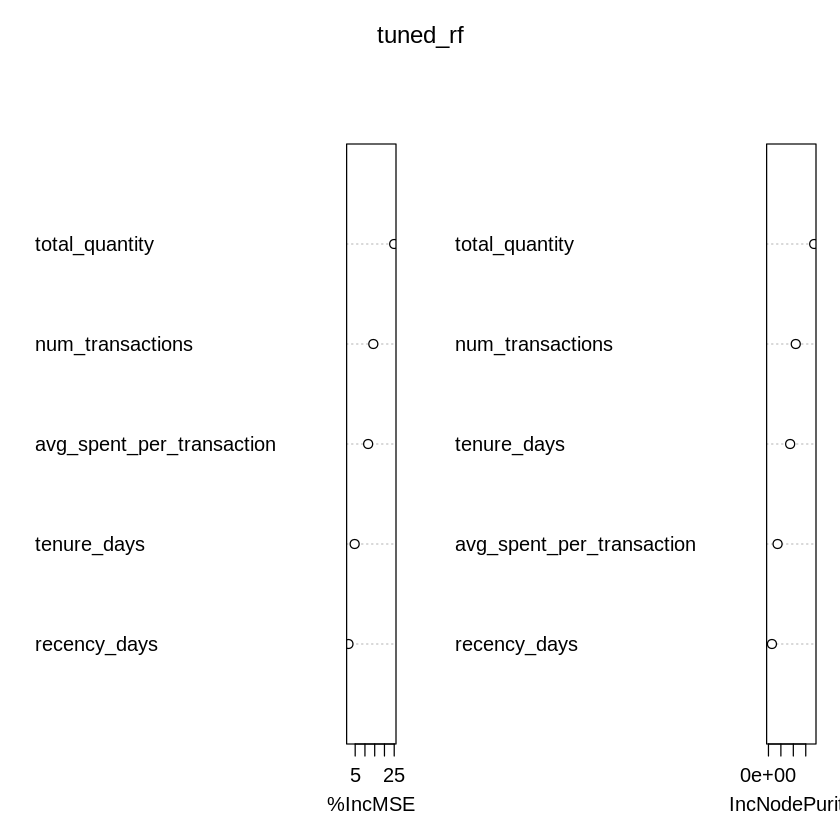

In [41]:
tuned_rf <- randomForest(total_spent ~ ., data = train,
                         ntree = 500, mtry = sqrt(ncol(train)-1),
                         importance = TRUE)
tuned_preds <- predict(tuned_rf, newdata = test)

cat("Tuned RF RMSE:", rmse(test$total_spent, tuned_preds))
varImpPlot(tuned_rf)  # Feature importance


In [44]:
library(xgboost)

dtrain <- xgb.DMatrix(data = x_train, label = y_train)
dtest  <- xgb.DMatrix(data = x_test, label = y_test)

xgb_model <- xgboost(data = dtrain, nrounds = 200, objective = "reg:squarederror", verbose = 0)
xgb_preds <- predict(xgb_model, dtest)

cat("XGBoost RMSE:", rmse(y_test, xgb_preds))


XGBoost RMSE: 12340.73

In [45]:
params <- list(
  objective = "reg:squarederror",
  eta = 0.1,        # learning rate
  max_depth = 6,    # tree depth
  subsample = 0.8,  # row sampling
  colsample_bytree = 0.8
)

xgb_tuned <- xgb.train(
  params = params, data = dtrain, nrounds = 500,
  watchlist = list(train = dtrain, test = dtest),
  early_stopping_rounds = 20, print_every_n = 50
)

xgb_tuned_preds <- predict(xgb_tuned, dtest)
cat("Tuned XGBoost RMSE:", rmse(y_test, xgb_tuned_preds))


[1]	train-rmse:12933.212738	test-rmse:17955.416715 
Multiple eval metrics are present. Will use test_rmse for early stopping.
Will train until test_rmse hasn't improved in 20 rounds.

[51]	train-rmse:1082.429448	test-rmse:10677.487213 
[101]	train-rmse:411.816386	test-rmse:10609.137057 
Stopping. Best iteration:
[95]	train-rmse:444.265779	test-rmse:10608.454039

Tuned XGBoost RMSE: 10608.45

In [46]:
analysis_date <- max(df$invoice_date) + days(1)

rfm <- df %>%
  group_by(customer_id) %>%
  summarise(
    recency = as.numeric(analysis_date - max(invoice_date), units = "days"),
    frequency = n_distinct(invoice),
    monetary = sum(revenue),
    .groups = "drop"
  )

head(rfm)


customer_id,recency,frequency,monetary
<dbl>,<dbl>,<int>,<dbl>
12346,326.117361,12,77556.46
12347,2.873611,8,5633.32
12348,75.984028,5,2019.40
12349,19.124306,4,4428.69
12350,310.867361,1,334.40
12351,375.893750,1,300.93


In [47]:
rfm_scaled <- rfm %>%
  select(recency, frequency, monetary) %>%
  scale()


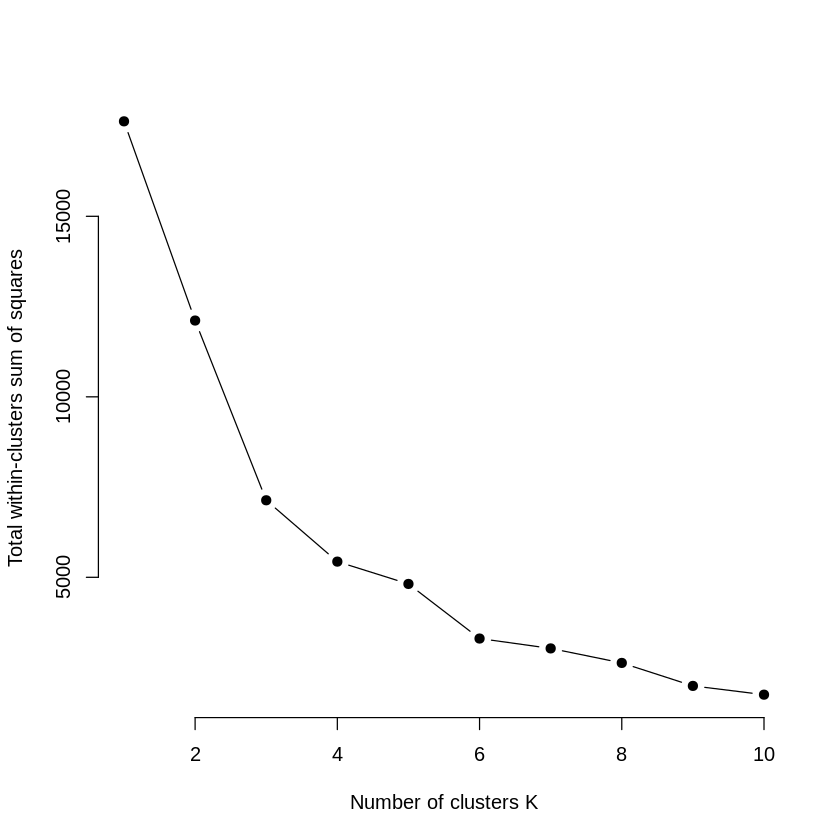

In [48]:
set.seed(123)
wss <- sapply(1:10, function(k) {
  kmeans(rfm_scaled, centers = k, nstart = 10)$tot.withinss
})

plot(1:10, wss, type="b", pch=19, frame=FALSE,
     xlab="Number of clusters K", ylab="Total within-clusters sum of squares")


In [49]:
set.seed(123)
kmeans_model <- kmeans(rfm_scaled, centers = 4, nstart = 25)
rfm$segment <- as.factor(kmeans_model$cluster)


In [50]:
rfm %>%
  group_by(segment) %>%
  summarise(
    avg_recency = mean(recency),
    avg_frequency = mean(frequency),
    avg_monetary = mean(monetary),
    customers = n()
  )


segment,avg_recency,avg_frequency,avg_monetary,customers
<fct>,<dbl>,<dbl>,<dbl>,<int>
1,72.431398,5.852153,2223.4778,3693
2,3.582323,193.545455,244510.0064,11
3,468.412131,2.161621,752.6758,1949
4,26.822340,40.066667,23891.3357,225


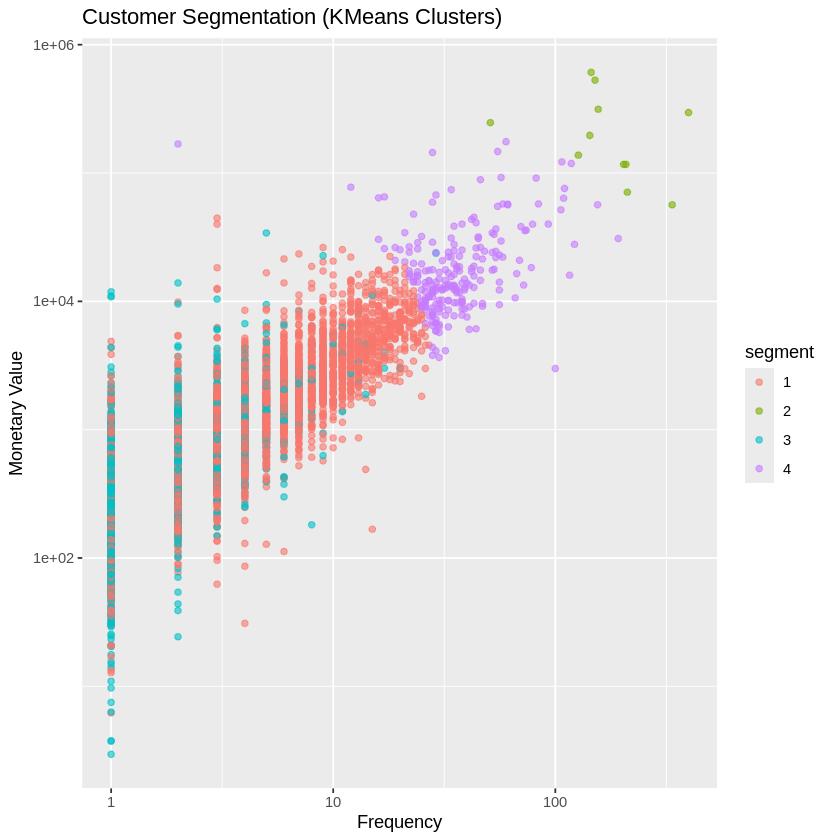

In [51]:
library(ggplot2)

ggplot(rfm, aes(x = frequency, y = monetary, color = segment)) +
  geom_point(alpha = 0.6) +
  scale_y_log10() + scale_x_log10() +   # better spread
  labs(title = "Customer Segmentation (KMeans Clusters)",
       x = "Frequency", y = "Monetary Value")


In [54]:
install.packages(c("tidyverse","lubridate","plotly","cluster","factoextra"))
library(tidyverse)
library(lubridate)
library(plotly)
library(cluster)
library(factoextra)


Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘rbibutils’, ‘Deriv’, ‘microbenchmark’, ‘Rdpack’, ‘doBy’, ‘SparseM’, ‘MatrixModels’, ‘minqa’, ‘nloptr’, ‘reformulas’, ‘carData’, ‘Formula’, ‘pbkrtest’, ‘quantreg’, ‘lme4’, ‘estimability’, ‘mvtnorm’, ‘corrplot’, ‘viridis’, ‘car’, ‘DT’, ‘ellipse’, ‘emmeans’, ‘flashClust’, ‘leaps’, ‘multcompView’, ‘scatterplot3d’, ‘ggsci’, ‘cowplot’, ‘ggsignif’, ‘gridExtra’, ‘polynom’, ‘rstatix’, ‘lazyeval’, ‘crosstalk’, ‘abind’, ‘dendextend’, ‘FactoMineR’, ‘ggpubr’, ‘ggrepel’



Attaching package: ‘plotly’


The following object is masked from ‘package:xgboost’:

    slice


The following object is masked from ‘package:ggplot2’:

    last_plot


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:graphics’:

    layout


Welcome! Want to learn more? See two factoextra-related books at https://goo.gl/ve3WBa



In [55]:
df <- df %>%
  mutate(InvoiceDate = as_date(InvoiceDate))

ref_date <- max(df$InvoiceDate) + days(1)

# RFM metrics
rfm <- df %>%
  group_by(CustomerID) %>%
  summarise(
    Recency = as.numeric(ref_date - max(InvoiceDate)),
    Frequency = n(),
    Monetary = sum(Amount)
  ) %>%
  ungroup()
head(rfm)


ERROR: [1m[33mError[39m in `mutate()`:[22m
[1m[22m[36mℹ[39m In argument: `InvoiceDate = as_date(InvoiceDate)`.
[1mCaused by error in `h()`:[22m
[33m![39m error in evaluating the argument 'x' in selecting a method for function 'as_date': object 'InvoiceDate' not found


In [57]:
ref_date <- max(df$invoice_date) + days(1)

# Calculate RFM metrics
rfm <- df %>%
  group_by(customer_id) %>%
  summarise(
    Recency = as.numeric(ref_date - max(invoice_date)),
    Frequency = n(),
    Monetary = sum(revenue, na.rm = TRUE)
  ) %>%
  ungroup()
head(rfm)


customer_id,Recency,Frequency,Monetary
<dbl>,<dbl>,<int>,<dbl>
12346,326.117361,34,77556.46
12347,2.873611,253,5633.32
12348,75.984028,51,2019.40
12349,19.124306,175,4428.69
12350,310.867361,17,334.40
12351,375.893750,21,300.93


In [58]:
# Scale RFM
rfm_scaled <- scale(rfm[,c("Recency","Frequency","Monetary")])

# KMeans with 3 clusters
set.seed(123)
km <- kmeans(rfm_scaled, centers = 3, nstart = 25)

# Add cluster labels
rfm$Cluster <- as.factor(km$cluster)


In [65]:
fig <- plot_ly(rfm,
               x = ~Recency, y = ~Frequency, z = ~Monetary,
               color = ~Cluster, colors = c("red","blue","green"),
               type = "scatter3d", mode = "markers",
               marker = list(size = 4)) %>%
       layout(scene = list(
         xaxis = list(title = 'Recency'),
         yaxis = list(title = 'Frequency'),
         zaxis = list(title = 'Monetary')
       ))
fig


HTML widgets cannot be represented in plain text (need html)

In [61]:
plot_ly(rfm, x = ~Cluster, type = "histogram", color = ~Cluster) %>%
  layout(title = "Number of Customers per Cluster")


HTML widgets cannot be represented in plain text (need html)

In [62]:
for (col in c("Recency","Frequency","Monetary")) {
  print(
    plot_ly(rfm, y = rfm[[col]], x = rfm$Cluster, color = rfm$Cluster,
            type = "box", name = col) %>%
    layout(yaxis=list(title=col),
           title = paste(col, "by Cluster"))
  )
}


In [64]:
# enable html widgets inside Colab
install.packages("htmlwidgets")
library(htmlwidgets)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



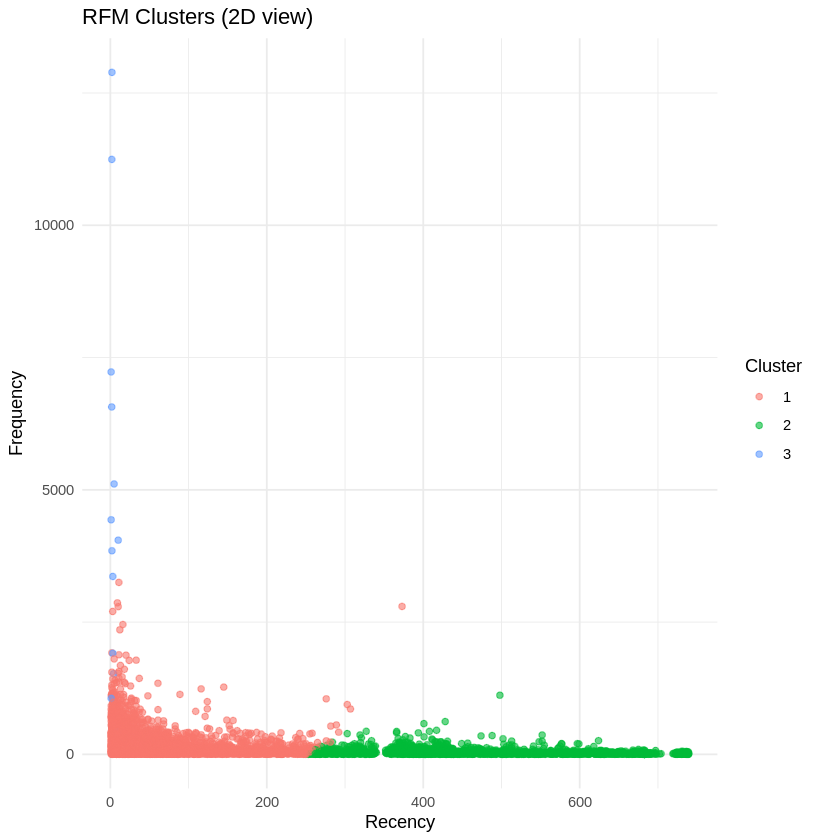

In [69]:
library(ggplot2)

ggplot(rfm, aes(x=Recency, y=Frequency, color=Cluster)) +
  geom_point(alpha=0.6) +
  labs(title="RFM Clusters (2D view)") +
  theme_minimal()



In [70]:
library(tidyverse)
library(lubridate)

# Reference date (last invoice + 1 day)
ref_date <- max(df$invoice_date) + days(1)

# RFM calculation
rfm <- df %>%
  group_by(customer_id) %>%
  summarise(
    Recency = as.numeric(ref_date - max(invoice_date)),
    Frequency = n(),
    Monetary = sum(revenue, na.rm = TRUE)
  ) %>%
  ungroup()


In [71]:
rfm_scaled <- scale(rfm[,c("Recency","Frequency","Monetary")])

set.seed(123)
km <- kmeans(rfm_scaled, centers = 3, nstart = 25)
rfm$Cluster <- as.factor(km$cluster)


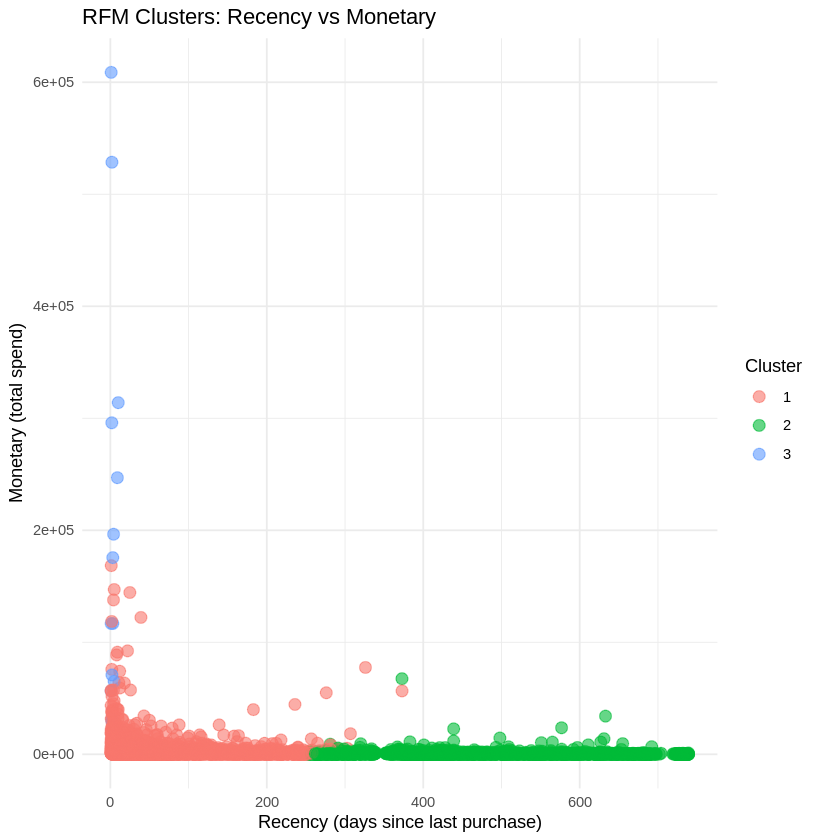

In [72]:
ggplot(rfm, aes(x=Recency, y=Monetary, color=Cluster)) +
  geom_point(alpha=0.6, size=3) +
  labs(title="RFM Clusters: Recency vs Monetary",
       x="Recency (days since last purchase)", y="Monetary (total spend)") +
  theme_minimal()


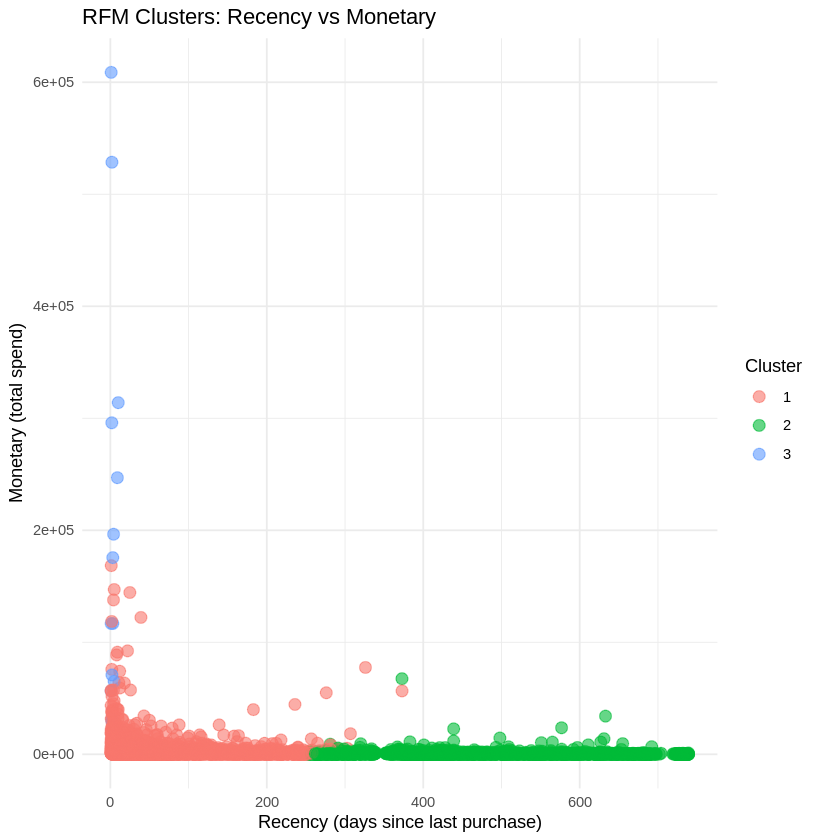

In [73]:
ggplot(rfm, aes(x=Recency, y=Monetary, color=Cluster)) +
  geom_point(alpha=0.6, size=3) +
  labs(title="RFM Clusters: Recency vs Monetary",
       x="Recency (days since last purchase)", y="Monetary (total spend)") +
  theme_minimal()


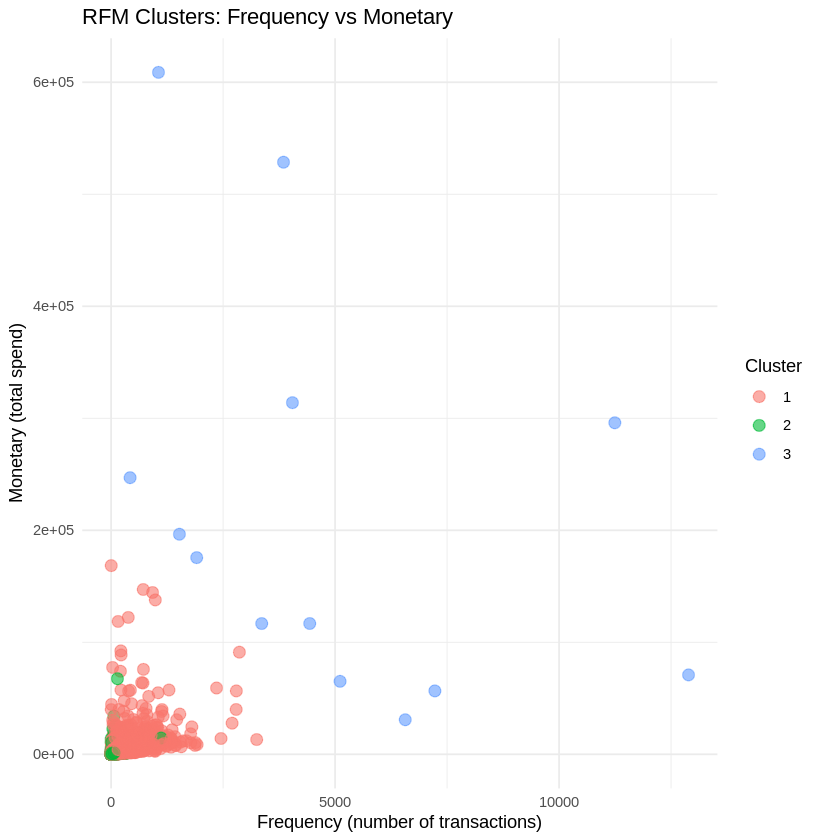

In [74]:
ggplot(rfm, aes(x=Frequency, y=Monetary, color=Cluster)) +
  geom_point(alpha=0.6, size=3) +
  labs(title="RFM Clusters: Frequency vs Monetary",
       x="Frequency (number of transactions)", y="Monetary (total spend)") +
  theme_minimal()


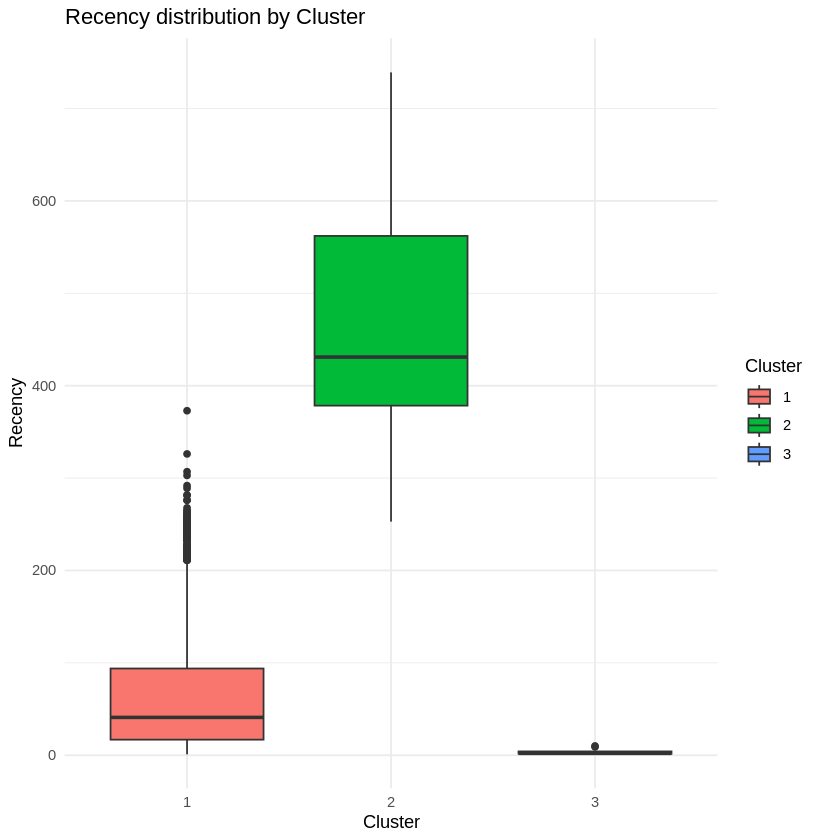

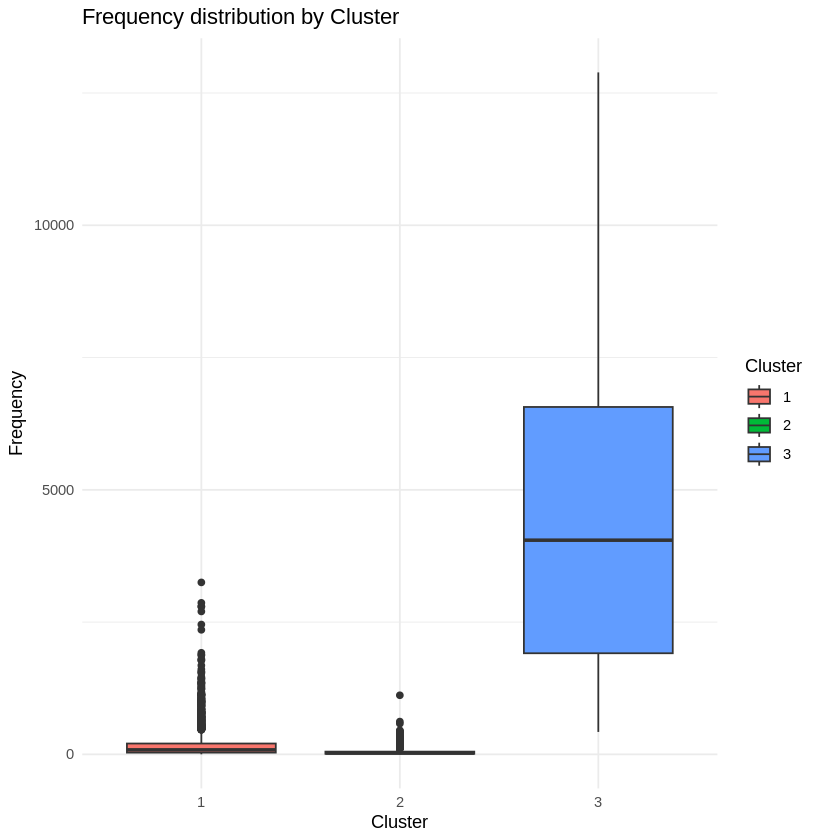

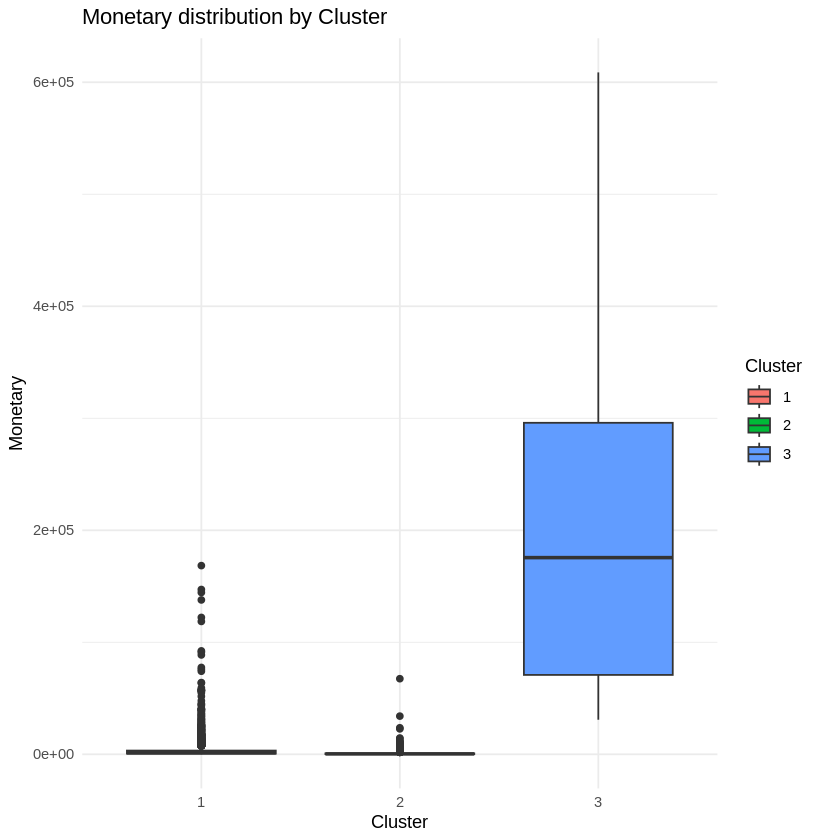

In [75]:
for (col in c("Recency","Frequency","Monetary")) {
  print(
    ggplot(rfm, aes(x=Cluster, y=.data[[col]], fill=Cluster)) +
      geom_boxplot() +
      labs(title=paste(col, "distribution by Cluster")) +
      theme_minimal()
  )
}


In [76]:
# Compute cluster averages
cluster_summary <- rfm %>%
  group_by(Cluster) %>%
  summarise(
    avg_recency = mean(Recency),
    avg_frequency = mean(Frequency),
    avg_monetary = mean(Monetary)
  )
cluster_summary


Cluster,avg_recency,avg_frequency,avg_monetary
<fct>,<dbl>,<dbl>,<dbl>
1,67.394729,169.37994,3446.7062
2,463.779359,43.37024,793.9389
3,3.463301,4896.23077,217186.2269


In [77]:
# Example mapping
cluster_labels <- c("1" = "Loyal / Potential",
                    "2" = "Champions",
                    "3" = "At Risk")

rfm$Segment <- cluster_labels[as.character(rfm$Cluster)]


In [78]:
rfm %>%
  group_by(Segment) %>%
  summarise(
    count = n(),
    avg_recency = mean(Recency),
    avg_frequency = mean(Frequency),
    avg_monetary = mean(Monetary)
  )


Segment,count,avg_recency,avg_frequency,avg_monetary
<chr>,<int>,<dbl>,<dbl>,<dbl>
At Risk,13,3.463301,4896.23077,217186.2269
Champions,1996,463.779359,43.37024,793.9389
Loyal / Potential,3869,67.394729,169.37994,3446.7062


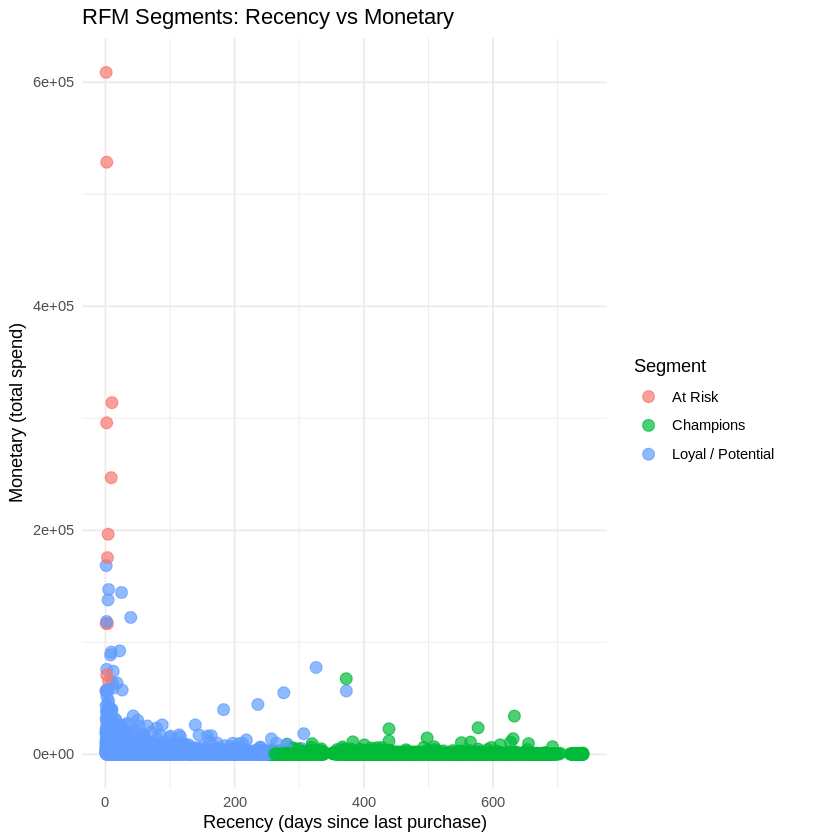

In [79]:
ggplot(rfm, aes(x=Recency, y=Monetary, color=Segment)) +
  geom_point(alpha=0.7, size=3) +
  labs(title="RFM Segments: Recency vs Monetary",
       x="Recency (days since last purchase)",
       y="Monetary (total spend)") +
  theme_minimal()
